# Load

In [1]:
%load_ext autoreload
%autoreload 2
%pylab inline
%matplotlib inline

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
from anndata import AnnData
from scipy.sparse import diags
from scipy.io import mmwrite
from scipy import sparse
from scipy.optimize import fsolve,minimize
from tqdm import tqdm
from pathlib import Path
from typing import Union, Optional
import pickle
import seaborn as sns

In [3]:
from scDenorm.denorm import *

In [4]:
from scAnnot.tools import *

In [5]:
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib as mpl
sc.set_figure_params(scanpy=True, fontsize=14,facecolor=None,frameon=False,transparent=True)
mpl.rcParams['axes.spines.top'] = False
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.grid'] = False

mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['ps.fonttype']=42

mpl.rcParams['font.family'] = "sans-serif"
mpl.rcParams['font.sans-serif'] = "Arial"

# Preprocess 3k 10x PBMC
- https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html

In [ ]:
adata=sc.read('data/pbmc3k_raw.h5ad')

In [ ]:
adata

AnnData object with n_obs × n_vars = 2700 × 32738
    var: 'gene_ids'

In [ ]:
adata.X.data

array([1., 1., 2., ..., 1., 1., 3.], dtype=float32)

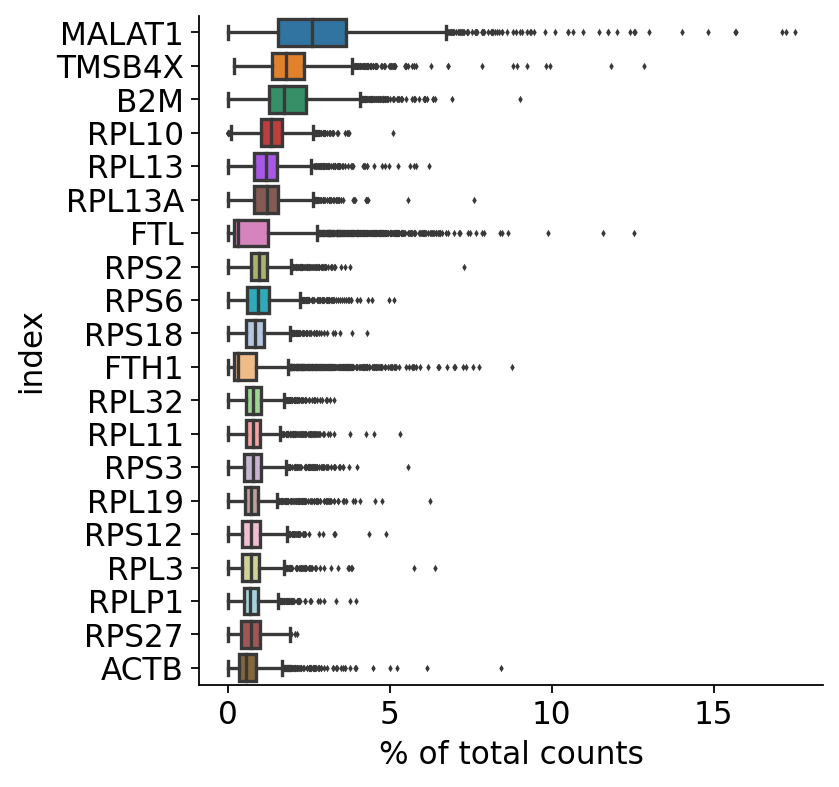

In [ ]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [ ]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

In [ ]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

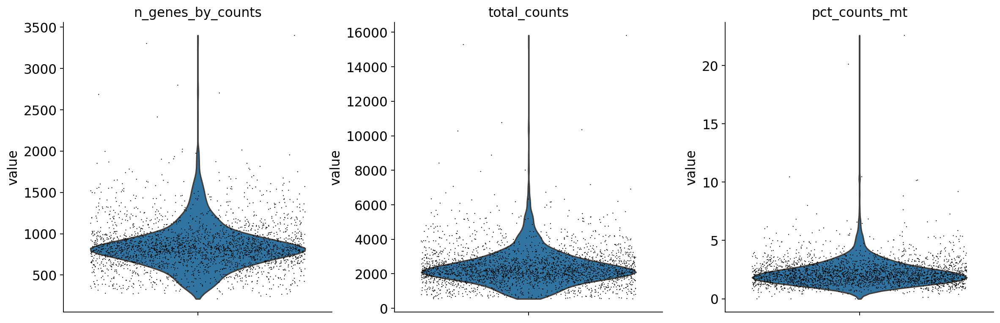

In [ ]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

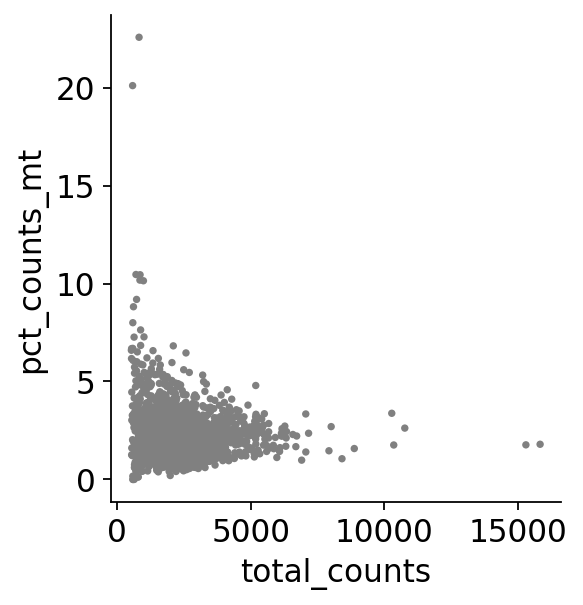

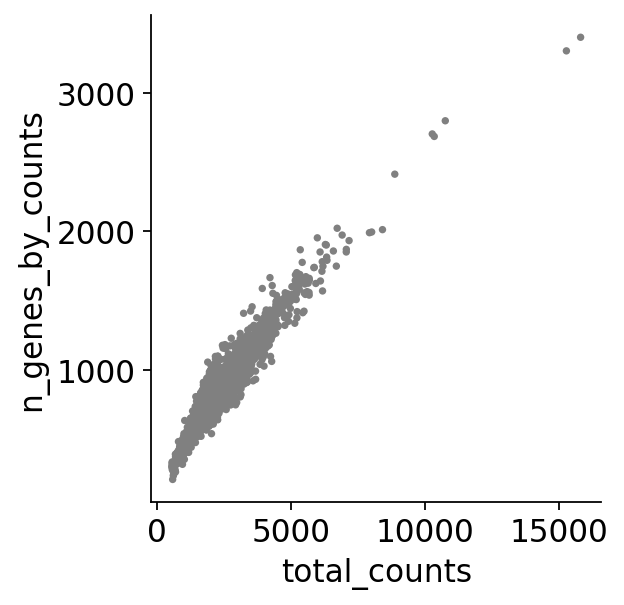

In [ ]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [ ]:
adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt < 5, :]

In [ ]:
adata

View of AnnData object with n_obs × n_vars = 2638 × 13714
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [ ]:
adata.layers['count']=adata.X.copy()

In [ ]:
adata.write_h5ad('data/pbmc3k_qc.h5ad')

In [ ]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

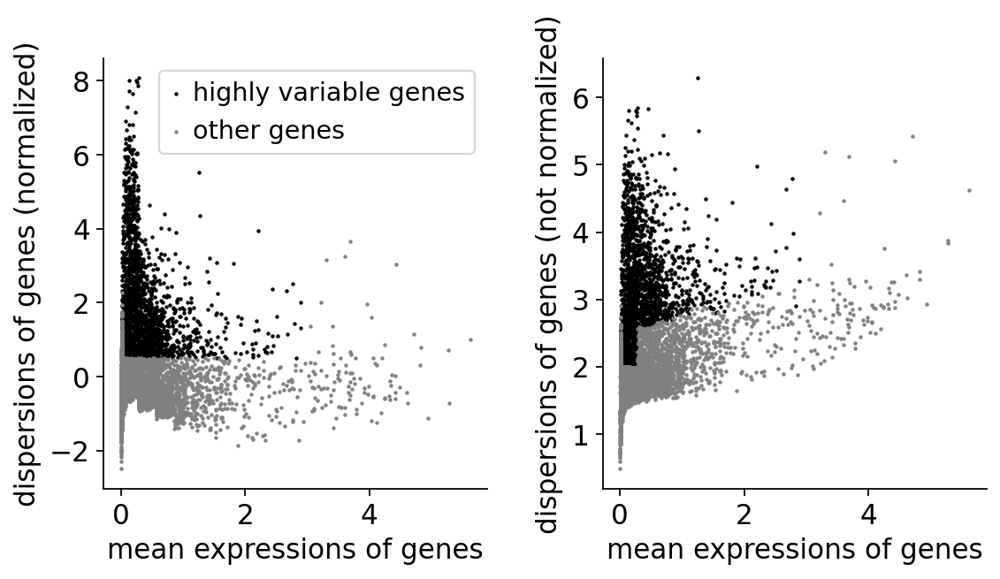

In [ ]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)

In [ ]:
adata.raw = adata

In [ ]:
adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')

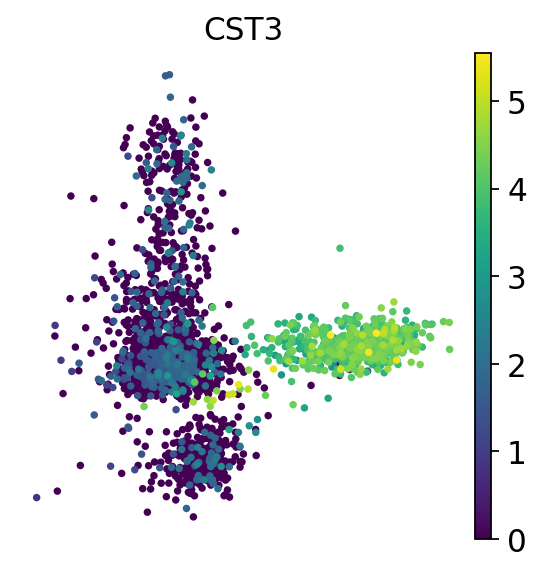

In [ ]:
sc.pl.pca(adata, color='CST3')

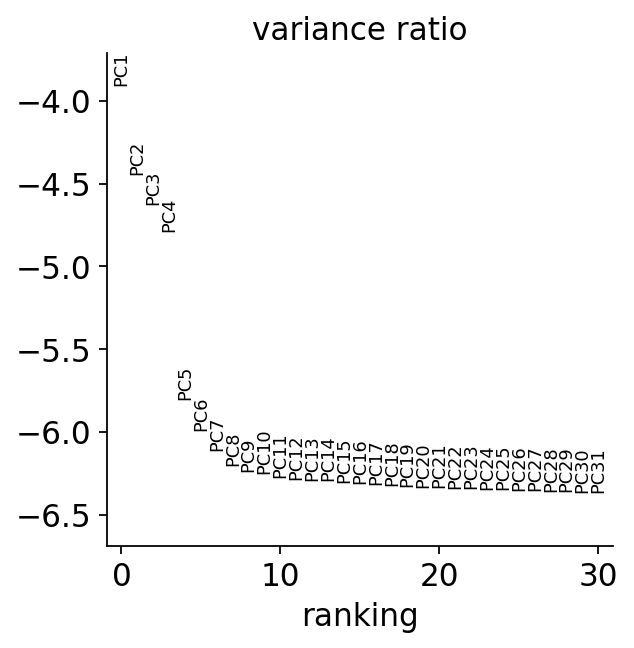

In [ ]:
sc.pl.pca_variance_ratio(adata, log=True)

In [ ]:
adata

AnnData object with n_obs × n_vars = 2638 × 1838
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'count'

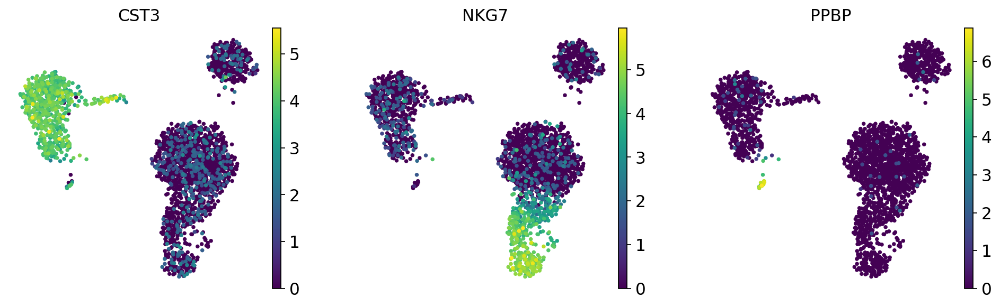

In [ ]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['CST3', 'NKG7', 'PPBP'])

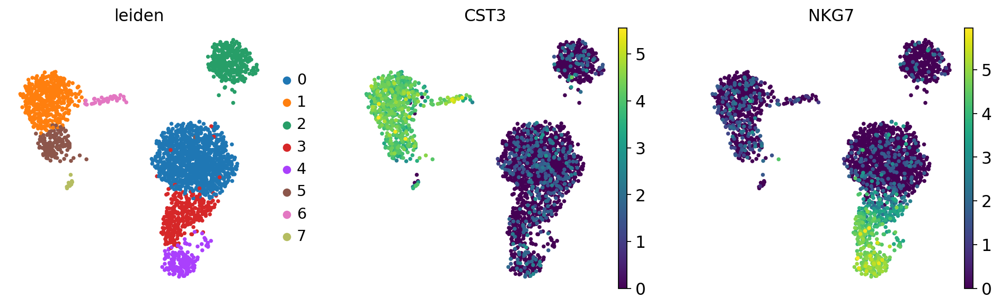

In [ ]:
sc.tl.leiden(adata)
sc.pl.umap(adata, color=['leiden', 'CST3', 'NKG7'])

In [ ]:
new_cluster_names = [
    'CD4 T', 'CD14 Monocytes',
    'B', 'CD8 T',
    'NK', 'FCGR3A Monocytes',
    'Dendritic', 'Megakaryocytes']
adata.rename_categories('leiden', new_cluster_names)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/anndata/_core/anndata.py:1160: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  self.obs[key].cat.rename_categories(categories, inplace=True)


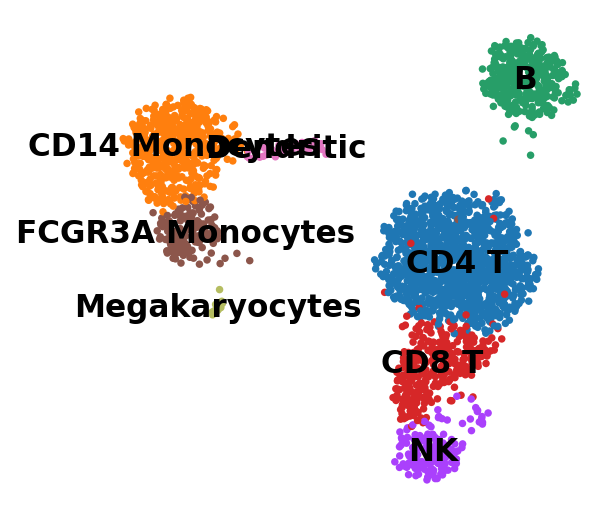

In [ ]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', frameon=False, save='.pdf')

In [ ]:
adata

AnnData object with n_obs × n_vars = 2638 × 1838
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'count'
    obsp: 'distances', 'connectivities'

In [ ]:
adata1=adata.raw.to_adata()

In [ ]:
adata1

AnnData object with n_obs × n_vars = 2638 × 13714
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [ ]:
adata1.var

,gene_ids,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm
index,,,,,,,,,,,
AL627309.1,ENSG00000237683,9,False,9,0.003333,99.666667,9.0,False,0.013556,1.432845,-0.624328
AP006222.2,ENSG00000228463,3,False,3,0.001111,99.888889,3.0,False,0.004696,1.458631,-0.573416
RP11-206L10.2,ENSG00000228327,5,False,5,0.001852,99.814815,5.0,False,0.005673,1.325459,-0.836358
RP11-206L10.9,ENSG00000237491,3,False,3,0.001111,99.888889,3.0,False,0.002644,0.859264,-1.756848
LINC00115,ENSG00000225880,18,False,18,0.006667,99.333333,18.0,False,0.027437,1.457477,-0.575693
...,...,...,...,...,...,...,...,...,...,...,...
AC145212.1,ENSG00000215750,16,False,16,0.006667,99.407407,18.0,False,0.027441,1.784637,0.070275
AL592183.1,ENSG00000220023,323,False,323,0.134815,88.037037,364.0,False,0.485051,1.859941,-0.437388
AL354822.1,ENSG00000215615,8,False,8,0.002963,99.703704,8.0,False,0.012157,1.781924,0.064919


In [ ]:
adata1.X.data

array([1.6358733, 1.6358733, 2.2265546, ..., 1.7984574, 1.7984574,
       2.7801206], dtype=float32)

In [ ]:
adata=sc.read_h5ad('data/pbmc3k_qc.h5ad')

In [ ]:
adata1.layers['count']=adata.X.copy()

In [ ]:
adata1.layers['norm']=adata1.X.copy()
adata1.X=adata1.layers['count'].copy()
adata1.X.data

array([1., 1., 2., ..., 1., 1., 3.], dtype=float32)

In [ ]:
adata1.write_h5ad('data/pbmc3k_qc_anno.h5ad')

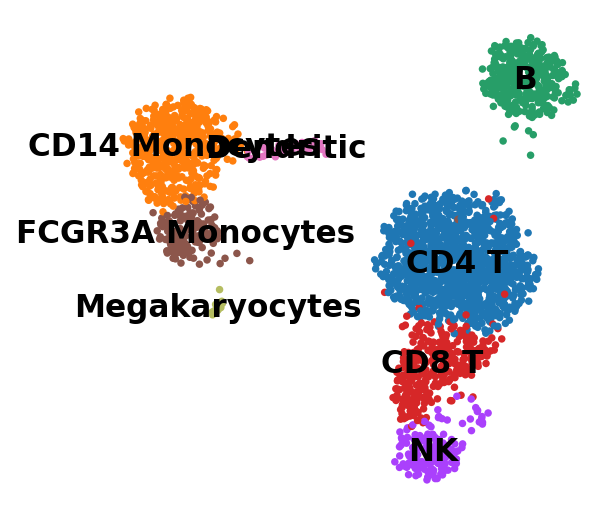

In [ ]:
sc.pl.umap(adata1, color='leiden', legend_loc='on data', title='', frameon=False, save='.pdf')

# UMAP with different normalizations

In [ ]:
adata=sc.read('data/pbmc3k_qc_anno.h5ad')

In [ ]:
cond=[
[1e3,np.e,1],
[1e4,np.e,1],
[1e5,np.e,1],
[1e6,np.e,1],
[1e4,2,1],
[1e4,10,1],
[1e4,np.e,0.01],
[1e4,np.e,0.1],
]

In [ ]:
new_ads=[]
for ts,b,c in cond:
    ad=adata.copy()
    ad.X=sparse.csc_matrix(ad.X)
    ad.layers['count']=ad.X.copy()
    sc.pp.normalize_total(ad, target_sum=ts)
    ad.X.data=np.log(ad.X.data+c) / np.log(b)
    new_ads.append(ad.copy())

In [ ]:
new_ads[0].X.data

array([0.3116164 , 0.25531396, 0.26490417, ..., 0.1464171 , 0.24044348,
       0.3765493 ], dtype=float32)

In [ ]:
ad=sc.concat(new_ads)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [12]:
ad.obs['group']=[elem for elem in [r'L: $10^{3}$, b: e, p: 1', r'L: $10^{4}$, b: e, p: 1', r'L: $10^{5}$, b: e, p: 1', r'L: $10^{6}$, b: e, p: 1',
                                   r'L: $10^{4}$, b: 2, p: 1', r'L: $10^{4}$, b: 10, p: 1', r'L: $10^{4}$, b: e, p: 0.01', r'L: $10^{4}$, b: e, p: 0.1'] for i in range(2638)]

In [13]:
ad.obs['group']=ad.obs['group'].astype('category')

In [14]:
ad.obs['group']=ad.obs['group'].cat.reorder_categories([r'L: $10^{3}$, b: e, p: 1', r'L: $10^{4}$, b: e, p: 1', r'L: $10^{5}$, b: e, p: 1', r'L: $10^{6}$, b: e, p: 1',
                                   r'L: $10^{4}$, b: 2, p: 1', r'L: $10^{4}$, b: 10, p: 1', r'L: $10^{4}$, b: e, p: 0.01', r'L: $10^{4}$, b: e, p: 0.1'])

In [ ]:
ad

AnnData object with n_obs × n_vars = 21104 × 13714
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'group'
    obsm: 'X_pca', 'X_umap'
    layers: 'count', 'norm'

In [ ]:
ad.var=adata.var.copy()

In [ ]:
sc.tl.pca(ad, svd_solver='arpack',use_highly_variable=True)
sc.pp.neighbors(ad)
sc.tl.umap(ad)

In [ ]:
ad.uns['leiden_colors']=['#5C89CC', '#FFB6C1', '#D9C566', '#FF8011', '#9440F3', '#E30B5C', '#AFE1AF', '#74caff']

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


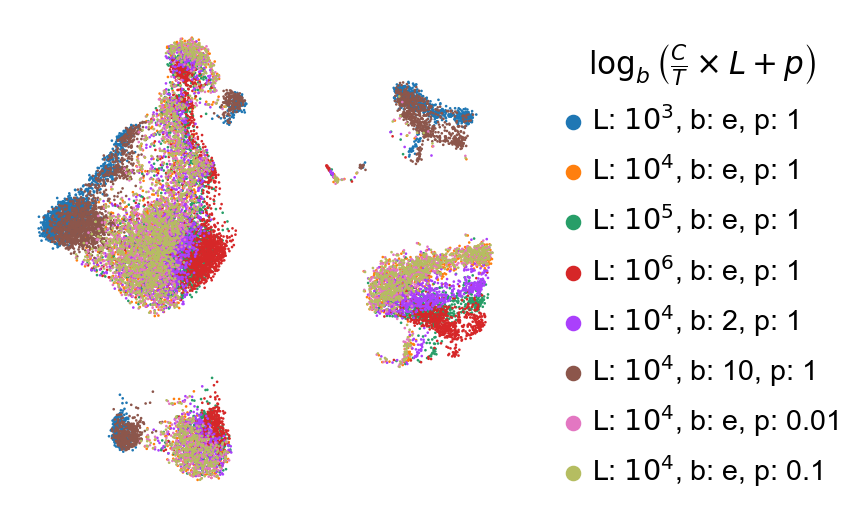

In [15]:
figsize(4,4)
ax=sc.pl.umap(ad, color=['group'], frameon=False,show=False, title='')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left',title=r'$\log_{b}^ \left(\frac{C}{T} \times L + p \right)$',frameon=False)
plt.savefig('figures/pbmc3k_benchmark_different_norms0.pdf',dpi=300, bbox_inches='tight',transparent=True,format='pdf')

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


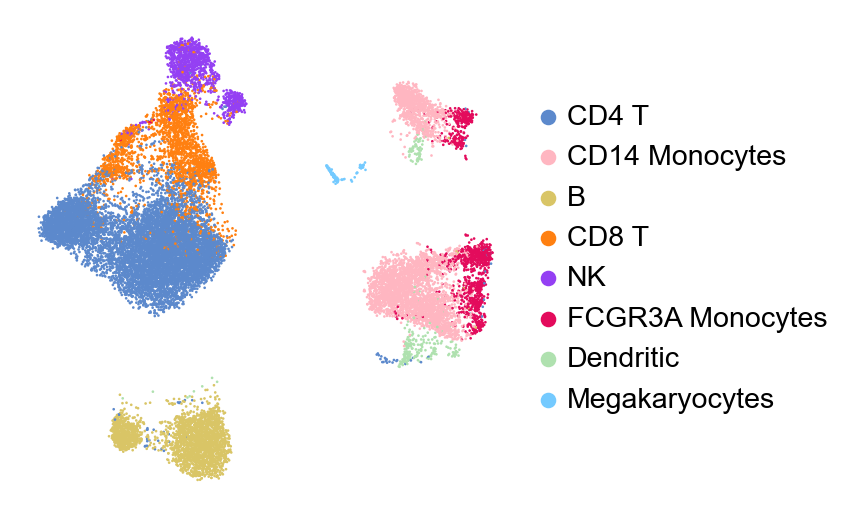

In [17]:
figsize(4,4)
sc.pl.umap(ad, color=['leiden'],frameon=False,title='',save='pbmc3k_benchmark_different_norms1.pdf')

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


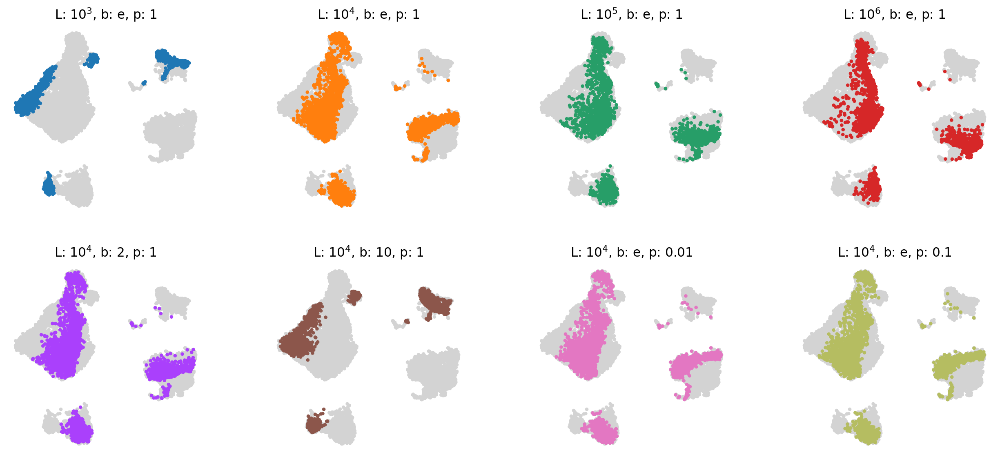

In [ ]:
cluster_small_multiples(ad,'group',save='pbmc3k_benchmark_different_norms2.pdf')

### save

In [16]:
ad.write_h5ad('results/pbmc3k_qc_anno_dn.h5ad')

## Integration

### harmony

In [10]:
ad1=ad.copy()

In [ ]:
ad

AnnData object with n_obs × n_vars = 21104 × 13714
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'group'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'group_colors', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'count', 'norm'
    obsp: 'connectivities', 'distances'

In [ ]:
sc.external.pp.harmony_integrate(ad, key=['group'], basis='X_pca', adjusted_basis='X_pca_harmony')
sc.pp.neighbors(ad, use_rep='X_pca_harmony')
sc.tl.umap(ad)

2023-09-25 16:52:08,820 - harmonypy - INFO - Iteration 1 of 10
2023-09-25 16:52:14,514 - harmonypy - INFO - Iteration 2 of 10
2023-09-25 16:52:21,121 - harmonypy - INFO - Iteration 3 of 10
2023-09-25 16:52:27,047 - harmonypy - INFO - Converged after 3 iterations


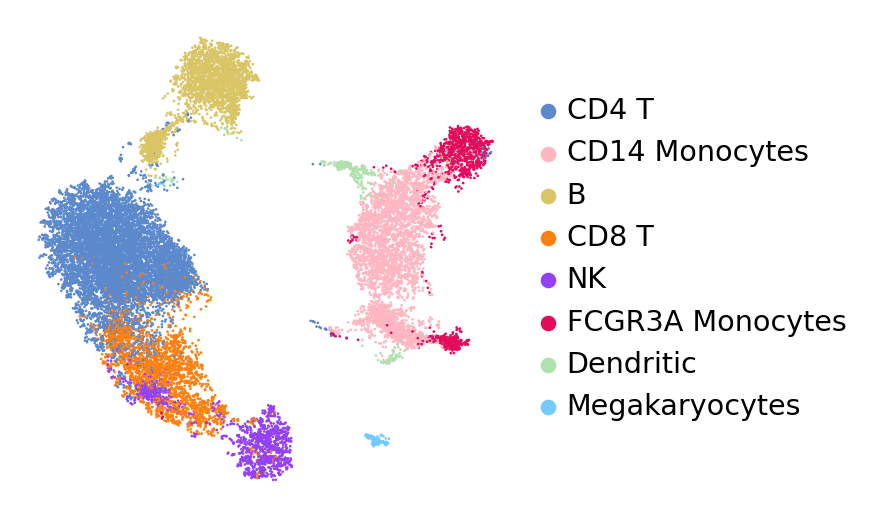

In [ ]:
figsize(4,4)
sc.pl.umap(ad, color=['leiden'],frameon=False,title='',save='pbmc3k_benchmark_different_norms_harmony0.pdf')

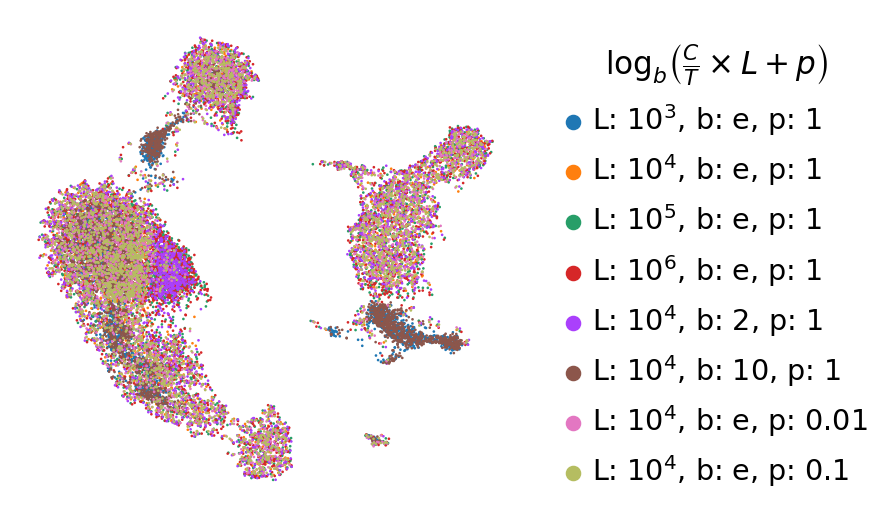

In [ ]:
figsize(4,4)
ax=sc.pl.umap(ad, color=['group'], frameon=False,show=False, title='')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left',title=r'$\log_{b}^ \left(\frac{C}{T} \times L + p \right)$',frameon=False)
plt.savefig('figures/pbmc3k_benchmark_different_norms_harmony1.pdf',dpi=300, bbox_inches='tight',transparent=True)

In [ ]:
ad.obs.group

index
AAACATACAACCAC-1      L: $10^{3}$, b: e, p: 1
AAACATTGAGCTAC-1      L: $10^{3}$, b: e, p: 1
AAACATTGATCAGC-1      L: $10^{3}$, b: e, p: 1
AAACCGTGCTTCCG-1      L: $10^{3}$, b: e, p: 1
AAACCGTGTATGCG-1      L: $10^{3}$, b: e, p: 1
                              ...            
TTTCGAACTCTCAT-1    L: $10^{4}$, b: e, p: 0.1
TTTCTACTGAGGCA-1    L: $10^{4}$, b: e, p: 0.1
TTTCTACTTCCTCG-1    L: $10^{4}$, b: e, p: 0.1
TTTGCATGAGAGGC-1    L: $10^{4}$, b: e, p: 0.1
TTTGCATGCCTCAC-1    L: $10^{4}$, b: e, p: 0.1
Name: group, Length: 21104, dtype: category
Categories (8, object): ['L: $10^{3}$, b: e, p: 1', 'L: $10^{4}$, b: e, p: 1', 'L: $10^{5}$, b: e, p: 1', 'L: $10^{6}$, b: e, p: 1', 'L: $10^{4}$, b: 2, p: 1', 'L: $10^{4}$, b: 10, p: 1', 'L: $10^{4}$, b: e, p: 0.01', 'L: $10^{4}$, b: e, p: 0.1']

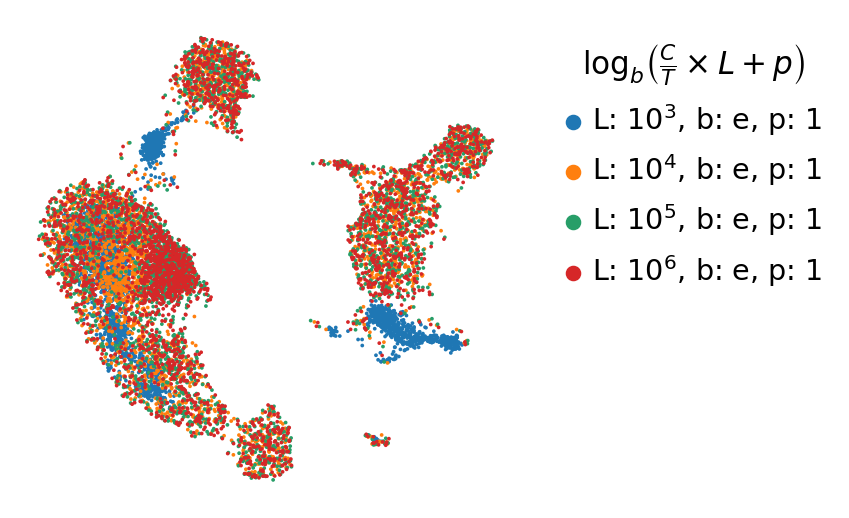

In [ ]:
figsize(4,4)
ax=sc.pl.umap(ad[ad.obs.group.isin(['L: $10^{3}$, b: e, p: 1', 'L: $10^{4}$, b: e, p: 1', 'L: $10^{5}$, b: e, p: 1', 'L: $10^{6}$, b: e, p: 1'])], color=['group'], frameon=False,show=False, title='')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left',title=r'$\log_{b}^ \left(\frac{C}{T} \times L + p \right)$',frameon=False)
plt.savefig('figures/pbmc3k_benchmark_different_norms_harmony2.pdf',dpi=300, bbox_inches='tight',transparent=True)

In [ ]:
ad.obs.index = [str(i) for i in range(0,ad.shape[0])]

/tmp/ipykernel_55915/3447098964.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ad.obs[i][~ad.obs.group.isin([i])]='Unknown'


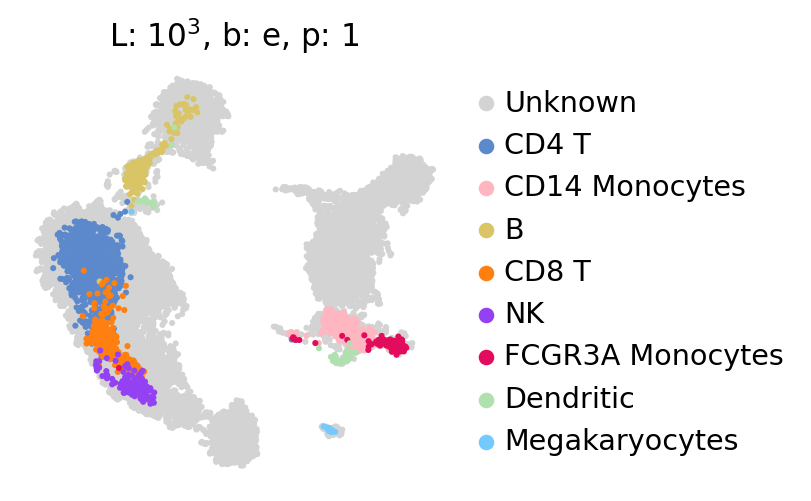

/tmp/ipykernel_55915/3447098964.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad.obs[i]=ad.obs.leiden.astype(str)
/tmp/ipykernel_55915/3447098964.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ad.obs[i][~ad.obs.group.isin([i])]='Unknown'


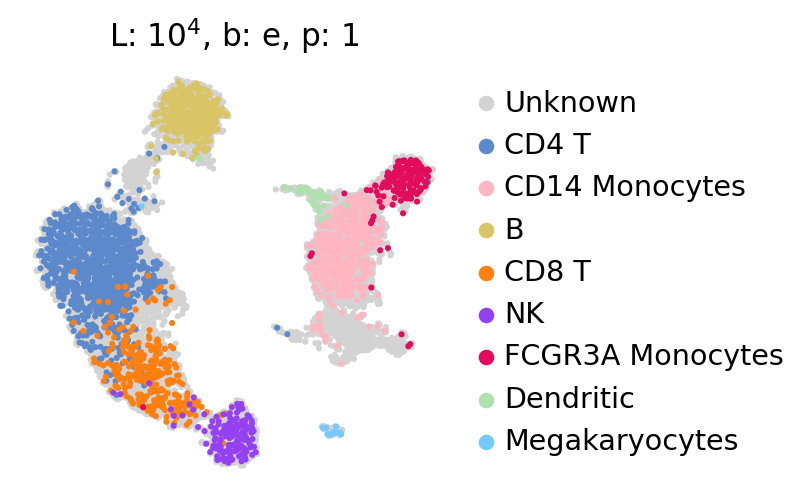

/tmp/ipykernel_55915/3447098964.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad.obs[i]=ad.obs.leiden.astype(str)
/tmp/ipykernel_55915/3447098964.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ad.obs[i][~ad.obs.group.isin([i])]='Unknown'


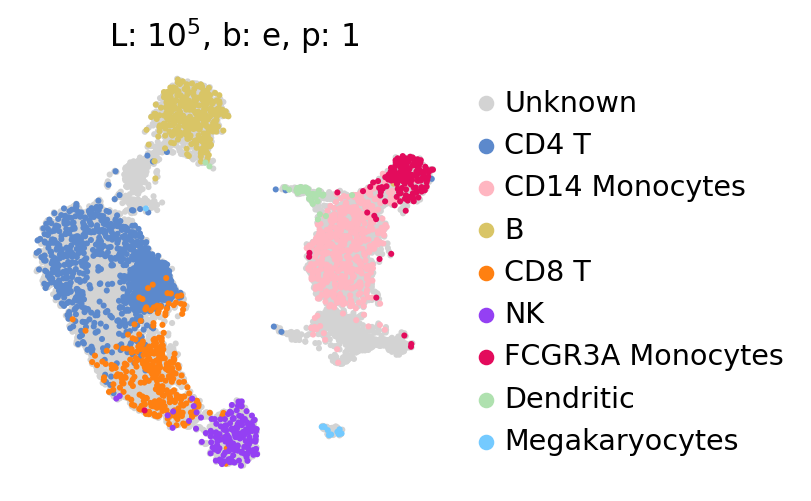

/tmp/ipykernel_55915/3447098964.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad.obs[i]=ad.obs.leiden.astype(str)
/tmp/ipykernel_55915/3447098964.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ad.obs[i][~ad.obs.group.isin([i])]='Unknown'


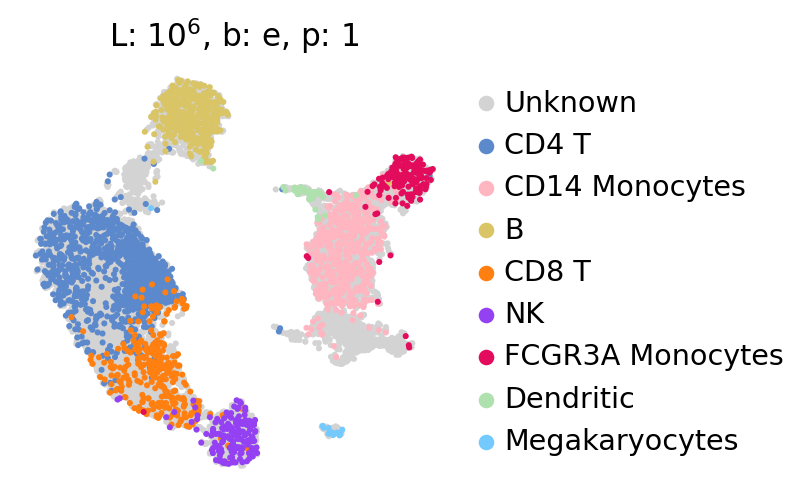

/tmp/ipykernel_55915/3447098964.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad.obs[i]=ad.obs.leiden.astype(str)
/tmp/ipykernel_55915/3447098964.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ad.obs[i][~ad.obs.group.isin([i])]='Unknown'


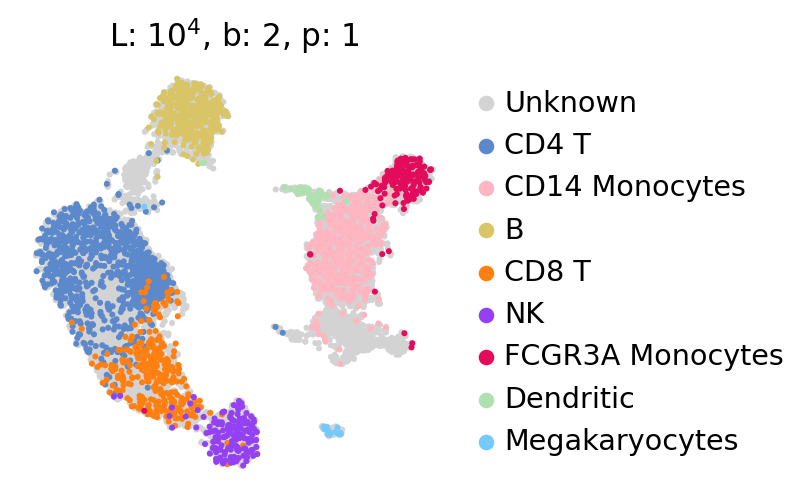

/tmp/ipykernel_55915/3447098964.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad.obs[i]=ad.obs.leiden.astype(str)
/tmp/ipykernel_55915/3447098964.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ad.obs[i][~ad.obs.group.isin([i])]='Unknown'


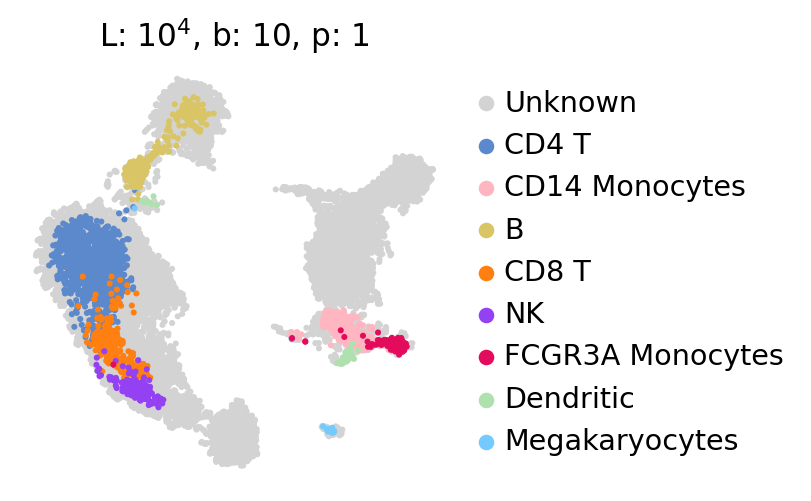

/tmp/ipykernel_55915/3447098964.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad.obs[i]=ad.obs.leiden.astype(str)
/tmp/ipykernel_55915/3447098964.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ad.obs[i][~ad.obs.group.isin([i])]='Unknown'


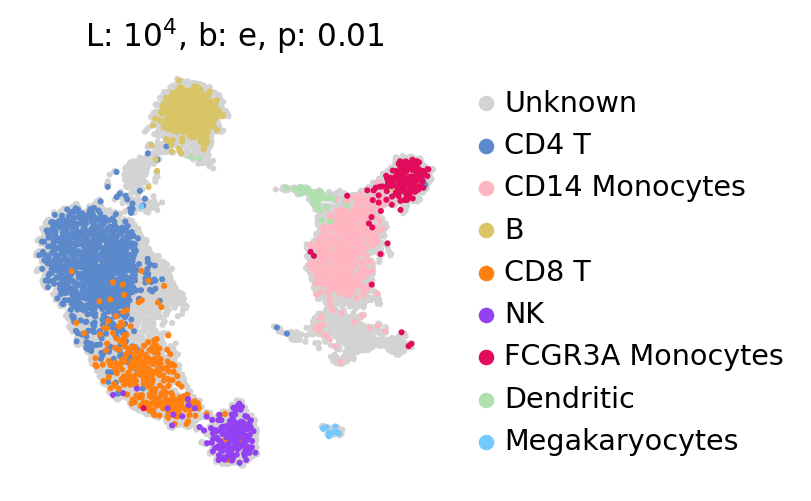

/tmp/ipykernel_55915/3447098964.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad.obs[i]=ad.obs.leiden.astype(str)
/tmp/ipykernel_55915/3447098964.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ad.obs[i][~ad.obs.group.isin([i])]='Unknown'


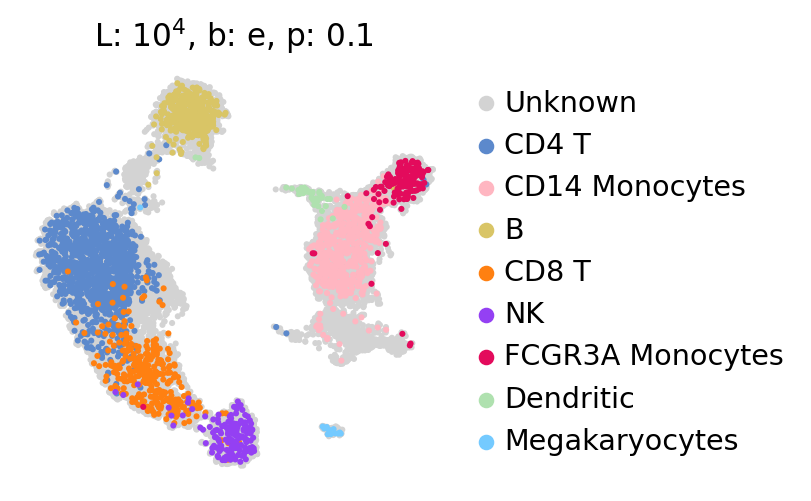

In [ ]:
figsize(3.5,3.5)
for i in ad.obs.group.cat.categories:
    ad.obs[i]=ad.obs.leiden.astype(str)
    ad.obs[i][~ad.obs.group.isin([i])]='Unknown'
    ad.obs[i]=ad.obs[i].astype('category')
    ad.obs[i]=ad.obs[i].cat.reorder_categories(['Unknown','CD4 T', 'CD14 Monocytes', 'B', 'CD8 T', 'NK', 'FCGR3A Monocytes',
           'Dendritic', 'Megakaryocytes'])
    ad.uns[f'{i}_colors']=['#d3d3d3','#5C89CC', '#FFB6C1', '#D9C566', '#FF8011', '#9440F3', '#E30B5C', '#AFE1AF', '#74caff']
    ad=ad[ad.obs[i].sort_values().index]
    sc.pl.umap(ad, color=[i],frameon=False,size=30)

In [ ]:
ad.uns['leiden_colors']

array(['#5C89CC', '#FFB6C1', '#D9C566', '#FF8011', '#9440F3', '#E30B5C',
       '#AFE1AF', '#74caff'], dtype=object)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_too

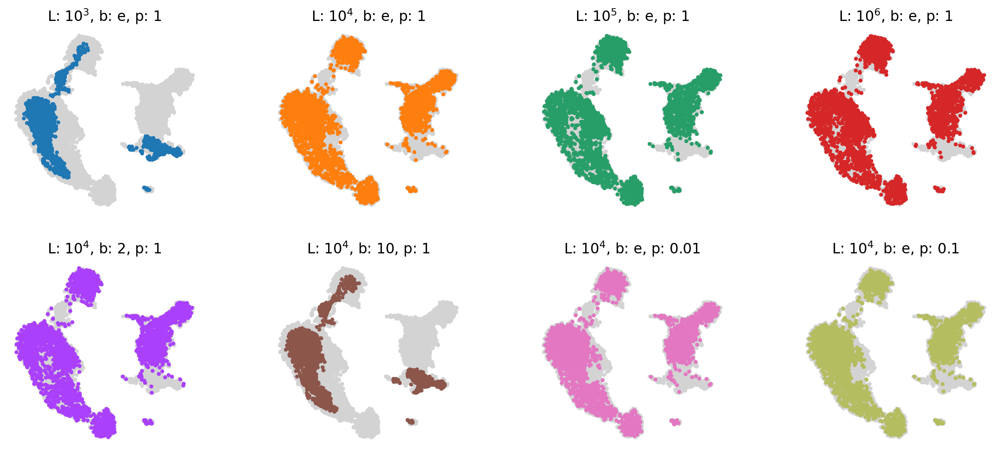

In [ ]:
cluster_small_multiples(ad,'group')#,save='pbmc3k_benchmark_different_norms.pdf')

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_too

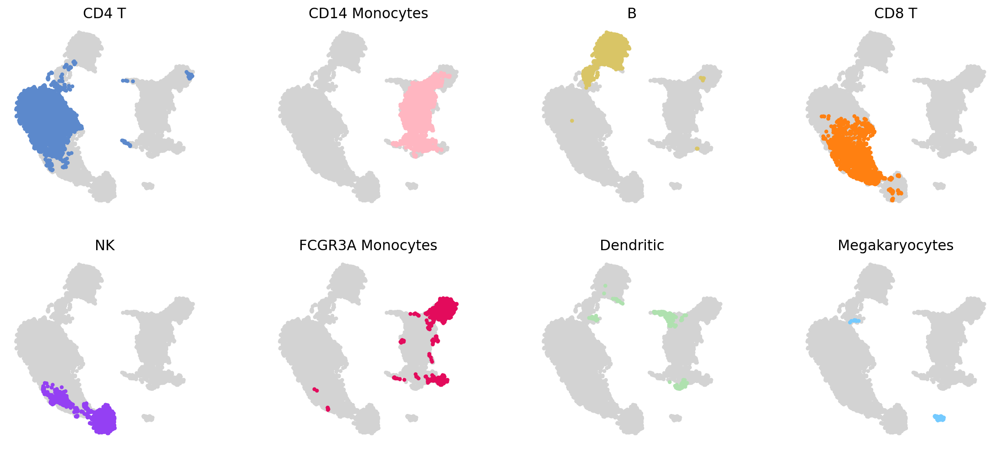

In [ ]:
cluster_small_multiples(ad,'leiden')#,save='pbmc3k_benchmark_different_norms.pdf')

### save

In [ ]:
ad.write_h5ad('data/pbmc3k_qc_anno_harmony.h5ad')

In [18]:
ad=sc.read('data/pbmc3k_qc_anno_harmony.h5ad')

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [19]:
ad.obs['leiden'] = ad.obs['leiden'].cat.rename_categories({'CD4 T':'CD4 T', 'CD14 Monocytes':'CD14 Mono', 'B':'B', 'CD8 T':'CD8 T', 
                                                           'NK':'NK', 'FCGR3A Monocytes':'FCGR3A Mono', 'Dendritic':'DC', 'Megakaryocytes':'MK'})

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


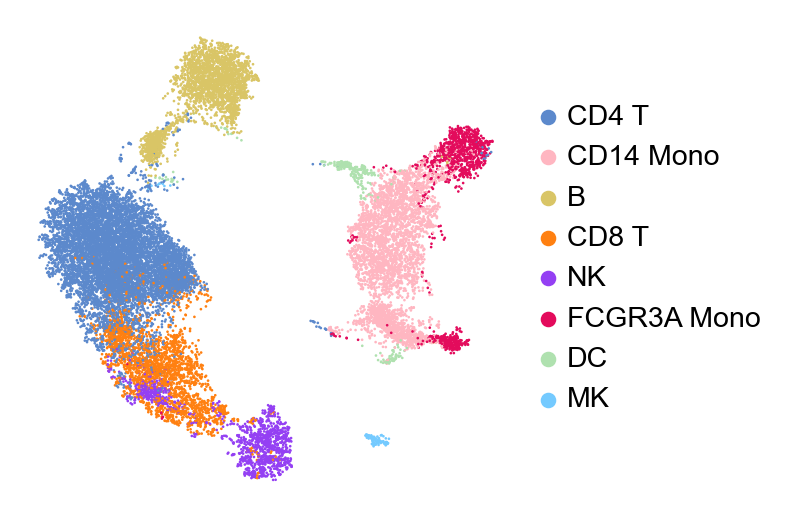

In [20]:
figsize(4,4)
sc.pl.umap(ad, color=['leiden'],frameon=False,title='',save='pbmc3k_benchmark_different_norms_harmony0.pdf')

/tmp/ipykernel_53169/3378265607.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ad.obs[i][~ad.obs.group.isin([i])]='Unknown'
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


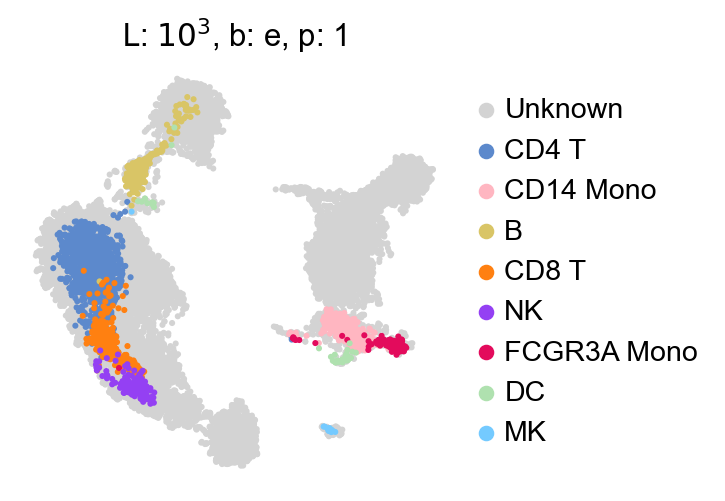

/tmp/ipykernel_53169/3378265607.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad.obs[i]=ad.obs.leiden.astype(str)


/tmp/ipykernel_53169/3378265607.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ad.obs[i][~ad.obs.group.isin([i])]='Unknown'
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


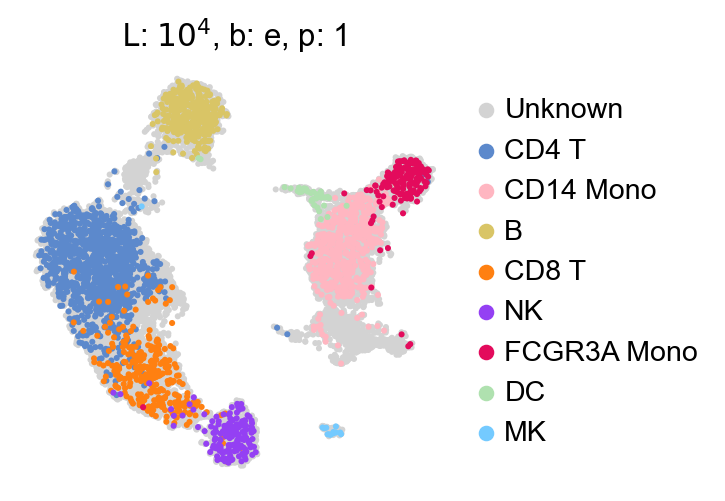

/tmp/ipykernel_53169/3378265607.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad.obs[i]=ad.obs.leiden.astype(str)


/tmp/ipykernel_53169/3378265607.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ad.obs[i][~ad.obs.group.isin([i])]='Unknown'
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


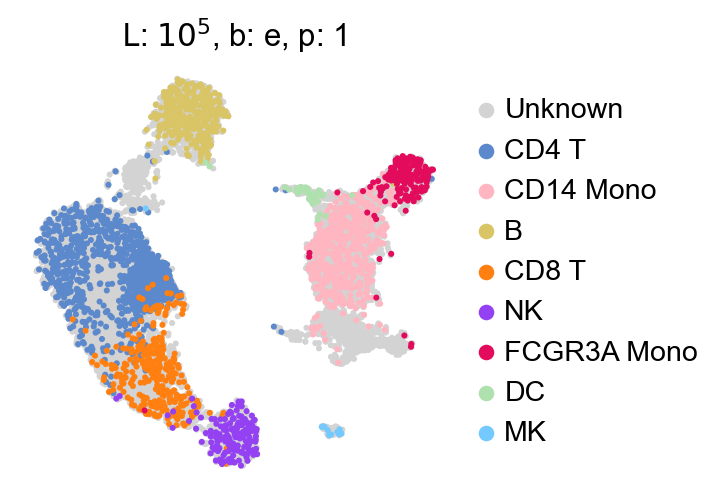

/tmp/ipykernel_53169/3378265607.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad.obs[i]=ad.obs.leiden.astype(str)


/tmp/ipykernel_53169/3378265607.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ad.obs[i][~ad.obs.group.isin([i])]='Unknown'
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


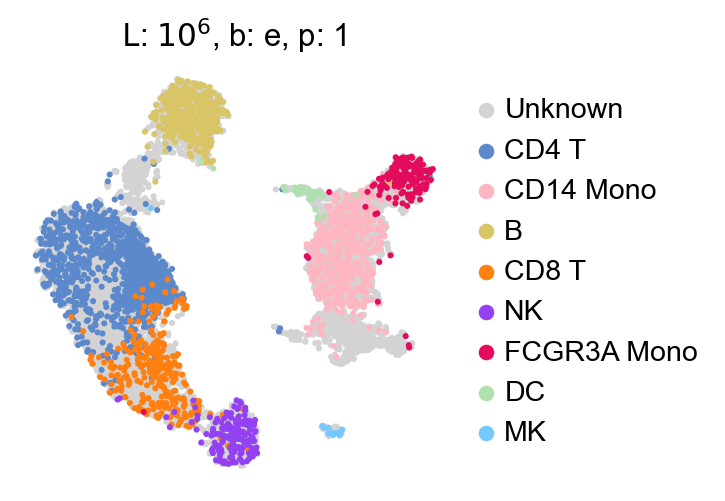

/tmp/ipykernel_53169/3378265607.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad.obs[i]=ad.obs.leiden.astype(str)


/tmp/ipykernel_53169/3378265607.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ad.obs[i][~ad.obs.group.isin([i])]='Unknown'
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


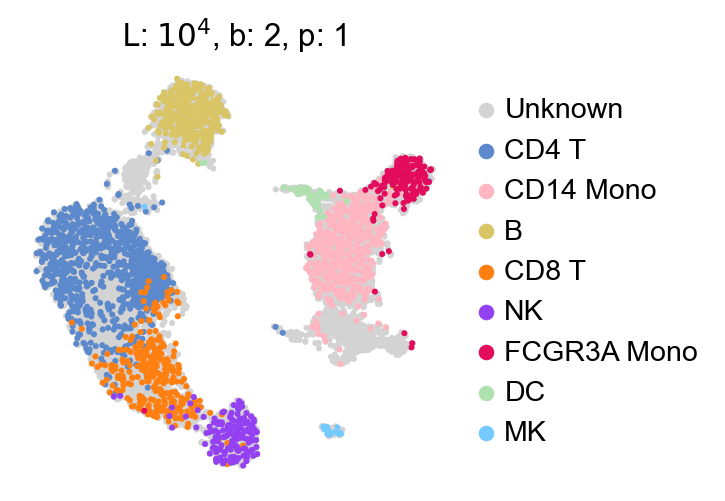

/tmp/ipykernel_53169/3378265607.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad.obs[i]=ad.obs.leiden.astype(str)


/tmp/ipykernel_53169/3378265607.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ad.obs[i][~ad.obs.group.isin([i])]='Unknown'
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


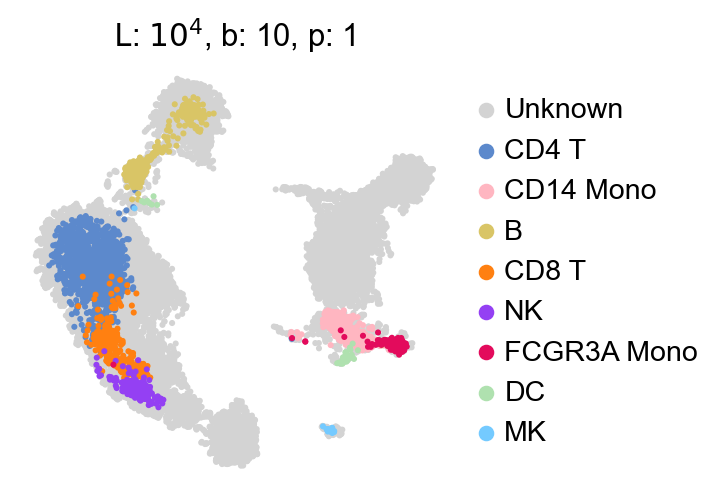

/tmp/ipykernel_53169/3378265607.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad.obs[i]=ad.obs.leiden.astype(str)


/tmp/ipykernel_53169/3378265607.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ad.obs[i][~ad.obs.group.isin([i])]='Unknown'
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


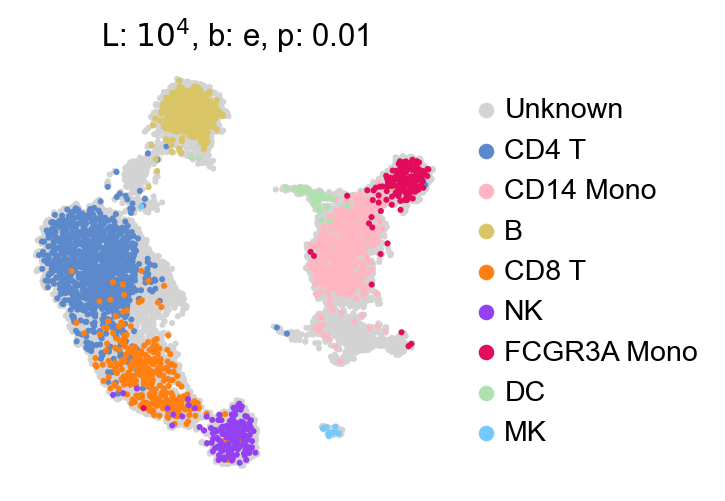

/tmp/ipykernel_53169/3378265607.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad.obs[i]=ad.obs.leiden.astype(str)


/tmp/ipykernel_53169/3378265607.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ad.obs[i][~ad.obs.group.isin([i])]='Unknown'
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


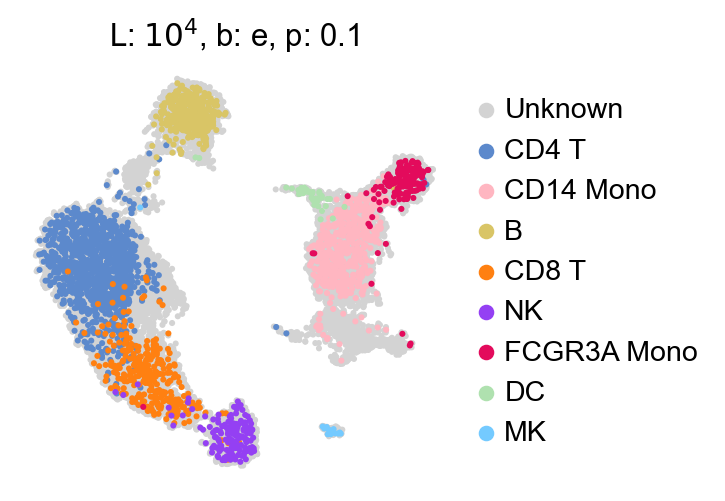

In [22]:
figsize(3.5,3.5)
for i in ad.obs.group.cat.categories:
    ad.obs[i]=ad.obs.leiden.astype(str)
    ad.obs[i][~ad.obs.group.isin([i])]='Unknown'
    ad.obs[i]=ad.obs[i].astype('category')
    ad.obs[i]=ad.obs[i].cat.reorder_categories(['Unknown','CD4 T', 'CD14 Mono', 'B', 'CD8 T', 'NK', 'FCGR3A Mono',
           'DC', 'MK'])
    ad.uns[f'{i}_colors']=['#d3d3d3','#5C89CC', '#FFB6C1', '#D9C566', '#FF8011', '#9440F3', '#E30B5C', '#AFE1AF', '#74caff']
    ad=ad[ad.obs[i].sort_values().index]
    sc.pl.umap(ad, color=[i],frameon=False,size=30,save=f'pbmc3k_benchmark_different_norms_harmony0_{i}.pdf')

### bbknn

In [ ]:
ad=ad1.copy()

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [ ]:
sc.external.pp.bbknn(ad, batch_key='group')

In [ ]:
sc.tl.umap(ad)

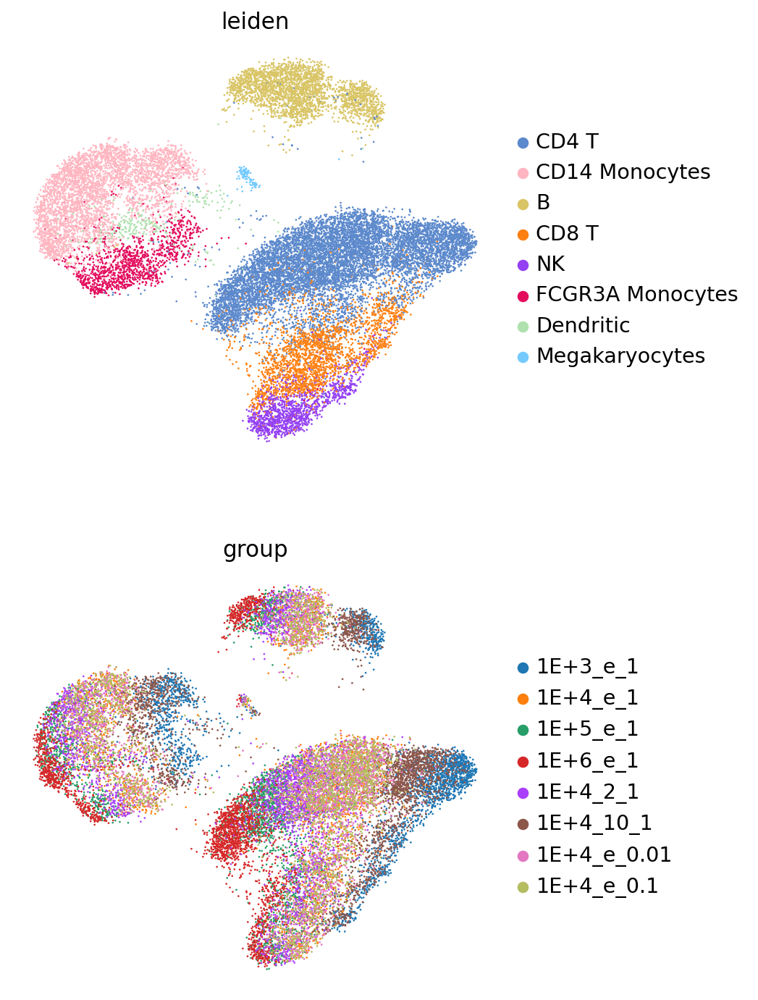

In [ ]:
figsize(5,5)
sc.pl.umap(ad, color=['leiden','group'],frameon=False,ncols=1,save='pbmc3k_benchmark_different_norms_bbknn.pdf')

### save

In [ ]:
ad.write_h5ad('data/pbmc3k_qc_anno_bbknn.h5ad')

### combat

In [ ]:
ad=ad1.copy()

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [ ]:
sc.pp.combat(ad, key='group')

Found 1 genes with zero variance.


/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/preprocessing/_combat.py:340: RuntimeWarning: invalid value encountered in true_divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/preprocessing/_combat.py:340: RuntimeWarning: divide by zero encountered in true_divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


In [ ]:
sc.tl.pca(ad, svd_solver='arpack',use_highly_variable=True)

In [ ]:
sc.pp.neighbors(ad)
sc.tl.umap(ad)

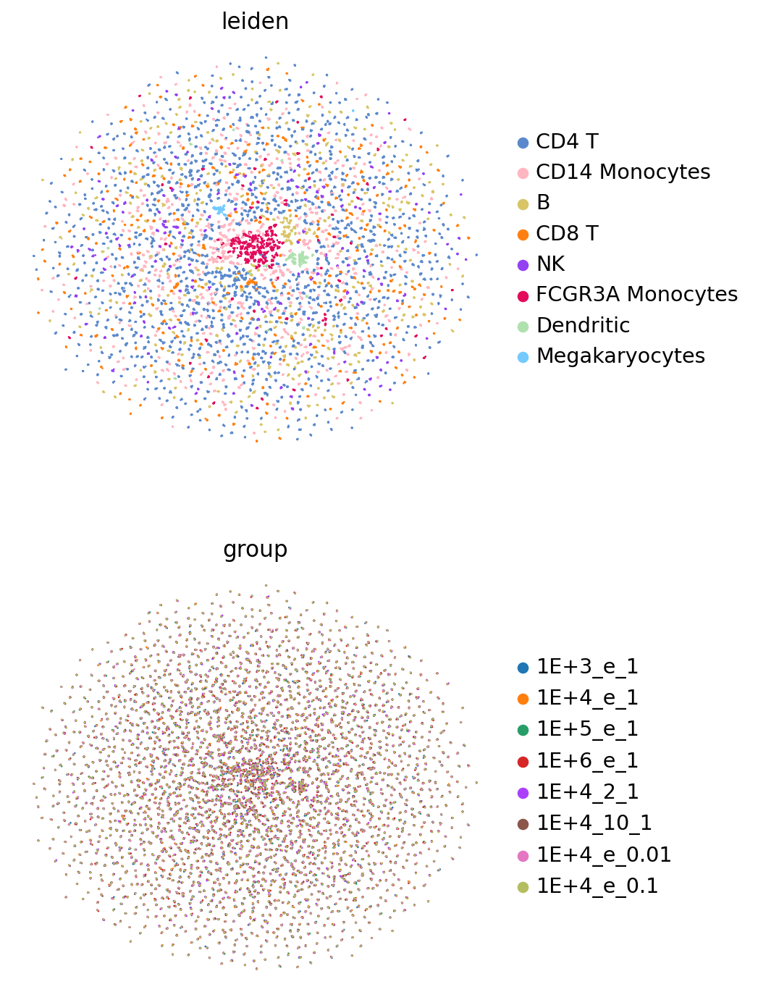

In [ ]:
figsize(5,5)
sc.pl.umap(ad, color=['leiden','group'],frameon=False,ncols=1,save='pbmc3k_benchmark_different_norms_combat.pdf')

### save

In [ ]:
ad.write_h5ad('data/pbmc3k_qc_anno_combat.h5ad')

### scanorama

In [11]:
import scanorama

In [12]:
ad=ad1.copy()

In [13]:
ad.obs['group'].cat.categories.tolist()

['1E+3_e_1',
 '1E+4_e_1',
 '1E+5_e_1',
 '1E+6_e_1',
 '1E+4_2_1',
 '1E+4_10_1',
 '1E+4_e_0.01',
 '1E+4_e_0.1']

In [14]:
batches = ad.obs['group'].cat.categories.tolist()
alldata = {}
for batch in batches:
    alldata[batch] = ad[ad.obs['group'] == batch,]

alldata   

{'1E+3_e_1': View of AnnData object with n_obs × n_vars = 2638 × 13714
     obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'group'
     var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
     uns: 'group_colors', 'leiden_colors', 'neighbors', 'pca', 'umap'
     obsm: 'X_pca', 'X_umap'
     varm: 'PCs'
     layers: 'count', 'norm'
     obsp: 'connectivities', 'distances',
 '1E+4_e_1': View of AnnData object with n_obs × n_vars = 2638 × 13714
     obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'group'
     var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
     uns: 'group_colors', 'leiden_colors', 'neighbors', 'pca', 'umap'
     obsm: 'X_pca', '

In [ ]:
#convert to list of AnnData objects
adatas = list(alldata.values())
# run scanorama.integrate
scanorama.integrate_scanpy(adatas, dimred = 50)

Found 13714 genes among all datasets


In [ ]:
# Get all the integrated matrices.
scanorama_int = [ad.obsm['X_scanorama'] for ad in adatas]

# make into one matrix.
all_s = np.concatenate(scanorama_int)
print(all_s.shape)

# add to the AnnData object, create a new object first
adata_sc = ad1.copy()
adata_sc.obsm["Scanorama"] = all_s

In [ ]:
sc.pp.neighbors(adata_sc, n_pcs =30, use_rep = "Scanorama")
sc.tl.umap(adata_sc)

In [ ]:
1

In [ ]:
ad=adata_sc.copy()

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


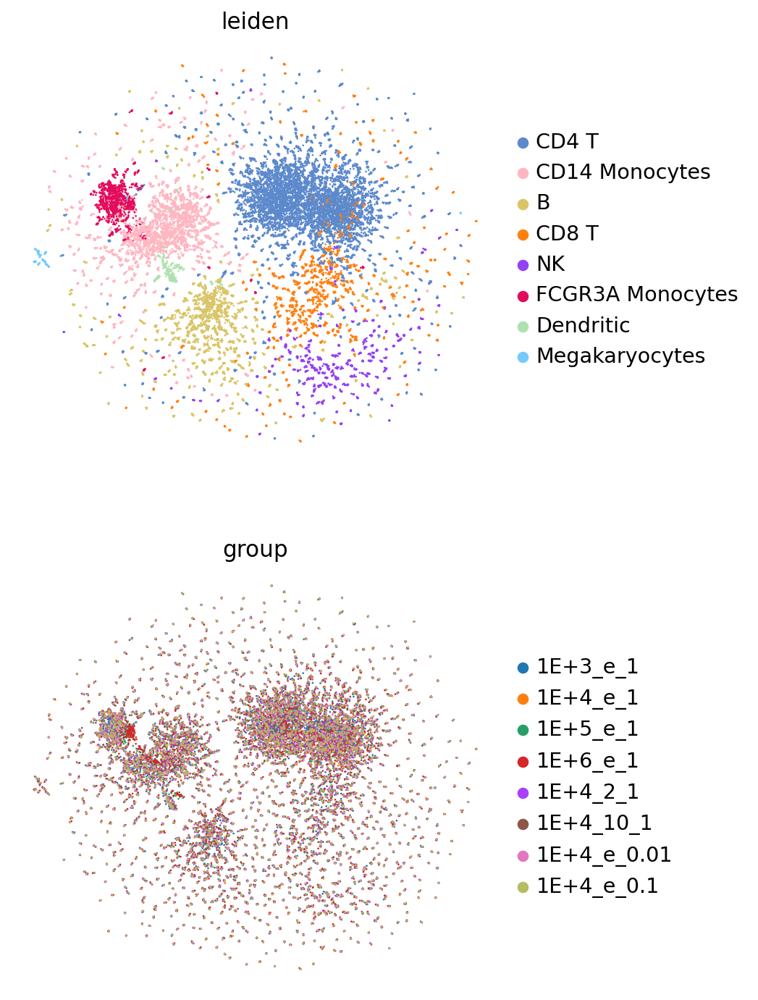

In [ ]:
figsize(5,5)
sc.pl.umap(ad, color=['leiden','group'],frameon=False,ncols=1,save='pbmc3k_benchmark_different_norms_scanorama.pdf')

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and

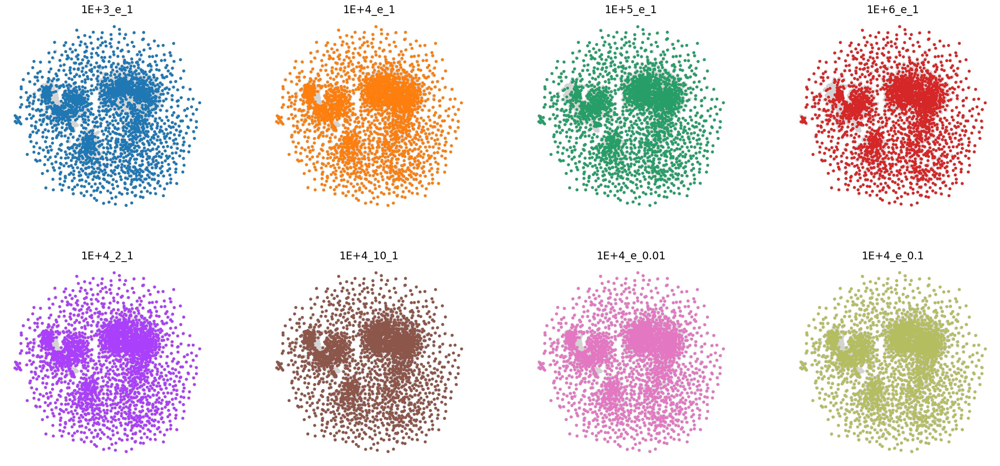

In [ ]:
cluster_small_multiples(ad,'group')

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and

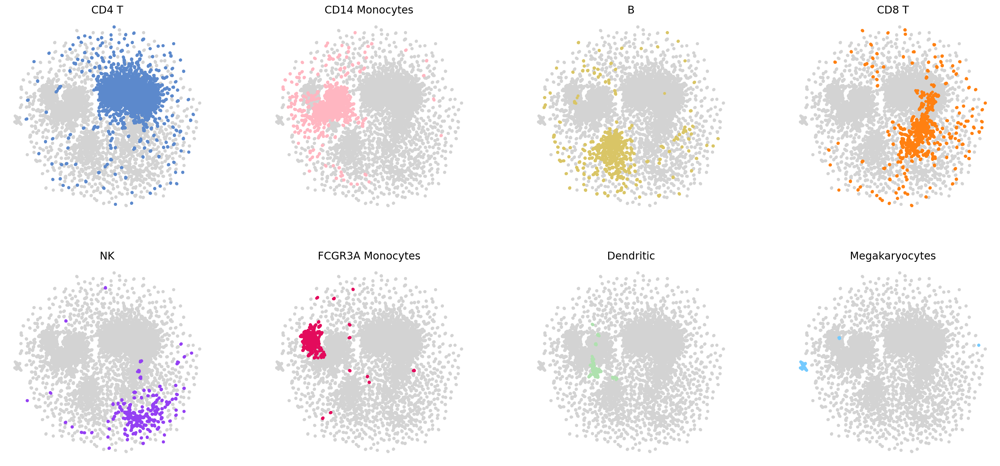

In [ ]:
cluster_small_multiples(ad,'leiden')

### save

In [ ]:
ad.write_h5ad('data/pbmc3k_qc_anno_scanorama.h5ad')

# The data distribution of droplet-based single-cell data

In [23]:
ad=sc.datasets.pbmc3k()

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [24]:
smtx = ad.copy().X.tocsr().asfptype()
sc.pp.normalize_total(ad, target_sum=1e4)
smtx1 = ad.copy().X.tocsr().asfptype()
sc.pp.log1p(ad)
smtx2 = ad.copy().X.tocsr().asfptype()

In [25]:
smtx.shape[0]

2700

In [26]:
tmp=pd.DataFrame(pd.Series(smtx[1].data).value_counts())

In [27]:
tmp.columns=['frequency']

In [28]:
tmp['count']=[int(i) for i in list(tmp.index)]

In [29]:
tmp['rank']=[i+1 for i in range(tmp.shape[0])]

In [30]:
tmp=tmp.sort_index()

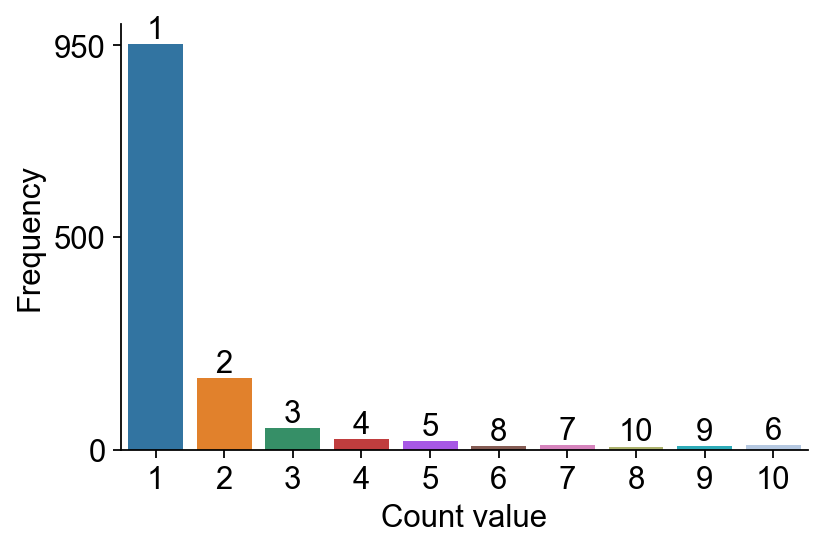

In [32]:
figsize(5.5,3.5)
# Create a bar plot
sns.barplot(x='count', y='frequency', data=tmp.iloc[:10, :])

# Set plot properties
plt.grid(visible=False)
#plt.ylim(0, 200)
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_yticks([0,500,950])
# Add text on top of the bars
for p,r in zip(ax.patches,tmp.iloc[:20,:]['rank']):
    height = p.get_height()
    ax.annotate(f'{r}', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom')
plt.xlabel('Count value')
plt.ylabel('Frequency')
# Show the plot
plt.savefig('figures/count_freq.pdf',dpi=300, bbox_inches='tight',transparent=True,format='pdf')

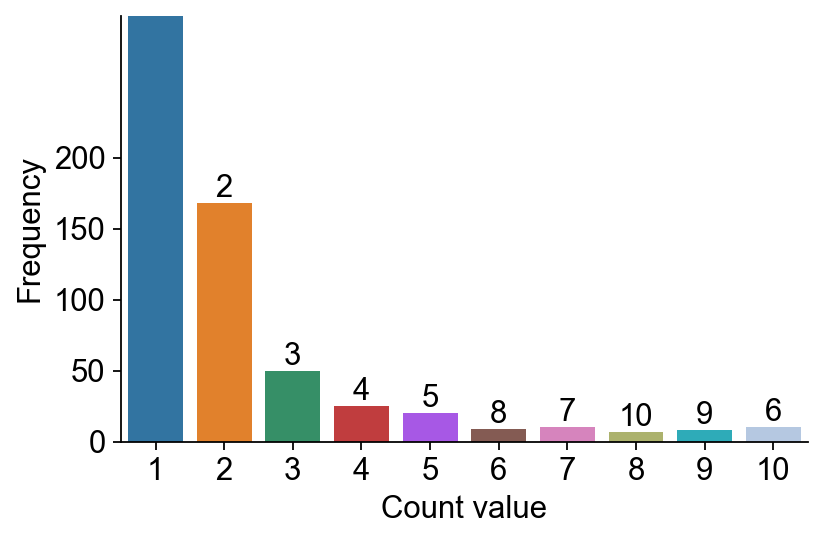

In [33]:
figsize(5.5,3.5)
# Create a bar plot
sns.barplot(x='count', y='frequency', data=tmp.iloc[:10, :])

# Set plot properties
plt.grid(visible=False)
plt.ylim(0, 300)
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_yticks([0,50,100,150,200])

# Add text on top of the bars
for p,r in zip(ax.patches,tmp.iloc[:20,:]['rank']):
    height = p.get_height()
    ax.annotate(f'{r}', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom')
plt.xlabel('Count value')
plt.ylabel('Frequency')
# Show the plot
plt.savefig('figures/count_freq1.pdf',dpi=300, bbox_inches='tight',transparent=True,format='pdf')

In [ ]:
def RCplot(smtx,xl='Rank of count frequency',yl='Count value',xm=None,ym=None,alpha=1,save=None):
    fig, ax = plt.subplots()
    for c_idx in range(smtx.shape[0]):
        c = pd.Series(smtx.getrow(c_idx).data)
        c=c.value_counts().sort_index()
        y = np.array(c.index)
        x = np.arange(0, c.shape[0])+1
        ax.scatter(x, y,alpha=alpha);


    #ax.legend(fontsize=15,bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.spines[['right', 'top']].set_visible(False)
    #ax.tick_params(axis='both', which='major')#, labelsize=15)
    #ax.tick_params(axis='both', which='minor')#, labelsize=8)
    ax.set_xlabel(xl)#,fontsize=18)
    ax.set_ylabel(yl)#,fontsize=18)
    if ym:
        plt.ylim(0,ym)
    if xm:
        plt.xlim(0,xm)
        plt.plot(np.arange(xm),np.arange(xm),'k-', alpha=1, zorder=0)
    if save:
        plt.savefig(save,dpi=300, bbox_inches='tight',transparent=True)

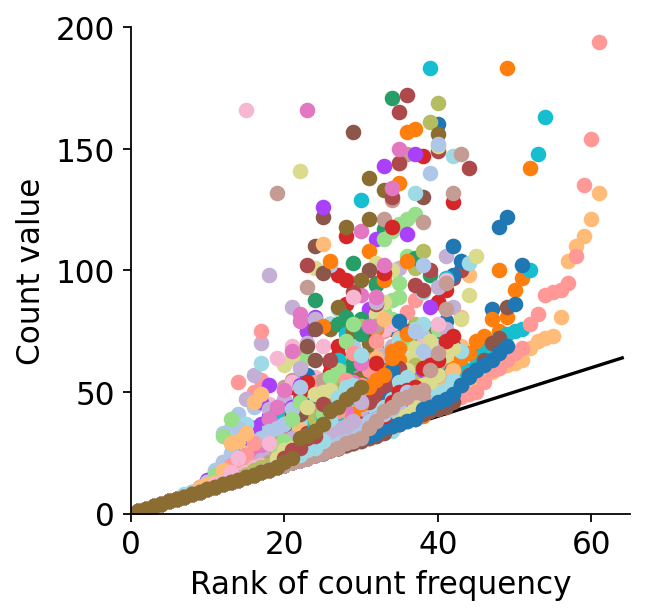

In [ ]:
figsize(4,4)
RCplot(smtx[:200],xm=65,ym=200,save='figures/rank/pbmc_rankvscount.pdf')

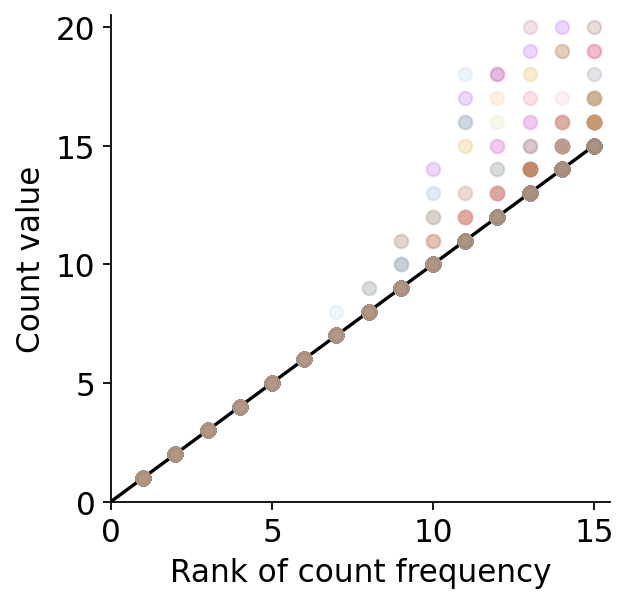

In [ ]:
RCplot(smtx[:200],xm=15.5,ym=20.5,alpha=0.2,save='figures/rank/pbmc_rankvscount_xlim15.pdf')

### Mean and variance (add NB fitted curve !!!)

In [34]:
import numpy as np
import pandas as pd
from scipy.optimize import curve_fit

def fit_nb(ms):
    
    def nb_func(x, phi):
        return x[0] + (phi * x[0] ** 2)
    
    popt, _ = curve_fit(nb_func, ms['mean'], ms['var'], p0=[1])
    phi = popt[0]
    
    ms['zeros_p'] = np.exp(-ms['mean'])
    ms['zeros_nb'] = (1 + phi * ms['mean']) ** (-1 / phi)
    ms['newVar'] = ms['mean'] + phi * ms['mean'] ** 2
    return ms

In [35]:
def plot_mv(cmean,cvar,c='blue',fit=False,save=None):
    fig, ax = plt.subplots()
    ax.loglog()
    #ax.set_xscale('log') 
    ax.scatter(cmean, cvar,s=20,c=c)
    lims = [
        np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
        np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
    ]

    ax.set_aspect('equal')
    #ax.tick_params(axis='both', which='major', labelsize=15)
    #ax.tick_params(axis='both', which='minor', labelsize=8)
    ax.set_xlim(lims)
    ax.set_ylim(lims)
    ax.spines[['right', 'top']].set_visible(False)
    ax.set_xlabel('Mean (genes)')#,fontsize=18)
    ax.set_ylabel('Variance (genes)')#,fontsize=18)
    
    ax.plot(lims, lims, linestyle='--', linewidth=2, alpha=0.75, color='#4C72B0', label='line')
    if fit:
        ms=pd.DataFrame({'mean':cmean[0],'var':cvar[0]})
        ms=fit_nb(ms)
        ms=ms.sort_values('mean')
        plt.plot(ms['mean'],ms['newVar'],'k-', alpha=1,linewidth=2, zorder=ms.shape[0],color='#DD8452', label='line')
    if save:
        plt.savefig(save,dpi=300, bbox_inches='tight',transparent=True,format='pdf')

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_53169/1834437742.py:25: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k-" (-> color='k'). The keyword argument will take precedence.
  plt.plot(ms['mean'],ms['newVar'],'k-', alpha=1,linewidth=2, zorder=ms.shape[0],color='#DD8452', label='line')


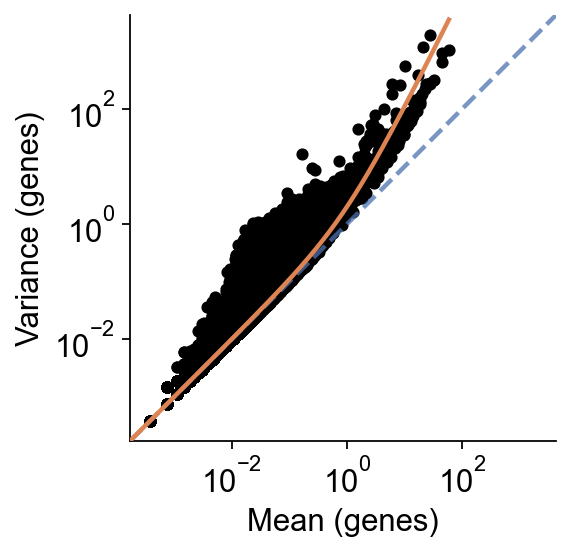

In [36]:
figsize(3.5,3.5)
cmean = np.array(smtx.mean(0))
cvar = np.array(smtx.power(2).mean(0) - cmean ** 2)
#A
plot_mv(cmean,cvar,c='black',fit=True,save='figures/pbmc_mvsv_raw_count.pdf')

# Datasets with different Seq-tech

In [37]:
with open('data/results/figure1_results.pickle', 'rb') as handle:
    df_mean,df_smart,df_drop,df_chrom,df_lst_smartseq,df_lst_dropseq,df_lst_chromseq=pickle.load(handle)

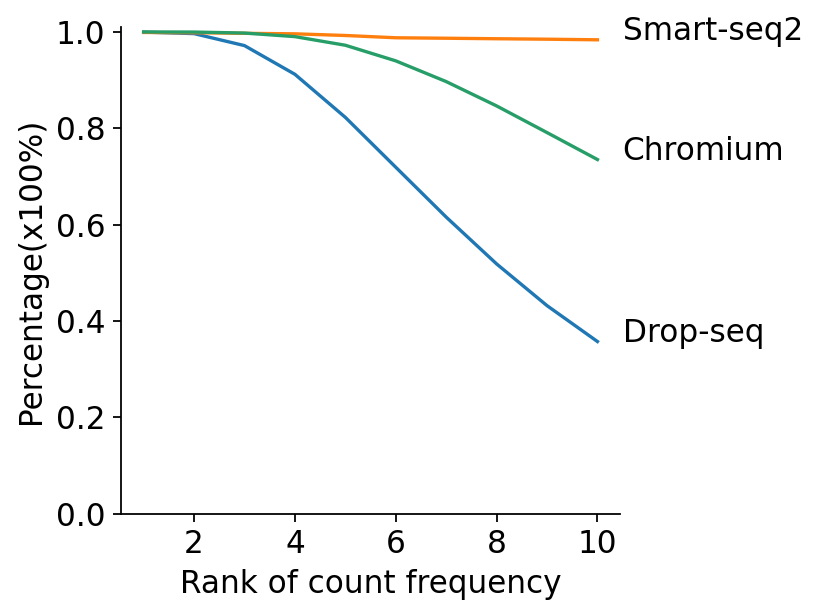

In [ ]:
figsize(4,4)
df=df_mean
for col in df.columns[:-1]:
    sns.lineplot(x='Rank', y=col, data=df)

    # Get the last x and y values of the line
    x_last = df['Rank'].iloc[-1]
    y_last = df[col].iloc[-1]

    # Add an annotation with the name of the line at the last point
    plt.gca().annotate(col, xy=(x_last, y_last), xytext=(x_last + 0.5, y_last), ha='left',fontsize=14)
sns.despine()
#plt.xticks(fontsize=15)
#plt.yticks(fontsize=15)
plt.ylim(0,1.01)
plt.grid(visible=False)
plt.ylabel('Percentage(x100%)')#, fontsize=18)
plt.xlabel('Rank of count frequency')#, fontsize=18)
plt.savefig('figures/The_top10_count_and_rank_consistency.pdf',dpi=300, bbox_inches='tight',transparent=True)

In [38]:
df1=df_drop.iloc[:5,:-1]
df1['Rank']=[str(i+1) for i in range(5)]
df1['Tech']='Drop-seq'
df1=pd.lreshape(df1, {'Sample': list(df1.columns[:-2])})

df2=df_smart.iloc[:5,:-1]
df2['Rank']=[str(i+1) for i in range(5)]
df2['Tech']='Smart-seq2'
df2=pd.lreshape(df2, {'Sample': list(df2.columns[:-2])})

df3=df_chrom.iloc[:5,:-1]
df3['Rank']=[str(i+1) for i in range(5)]
df3['Tech']='Chromium'
df3=pd.lreshape(df3, {'Sample': list(df3.columns[:-2])})
df = pd.concat([df3, df2, df1], axis=0)

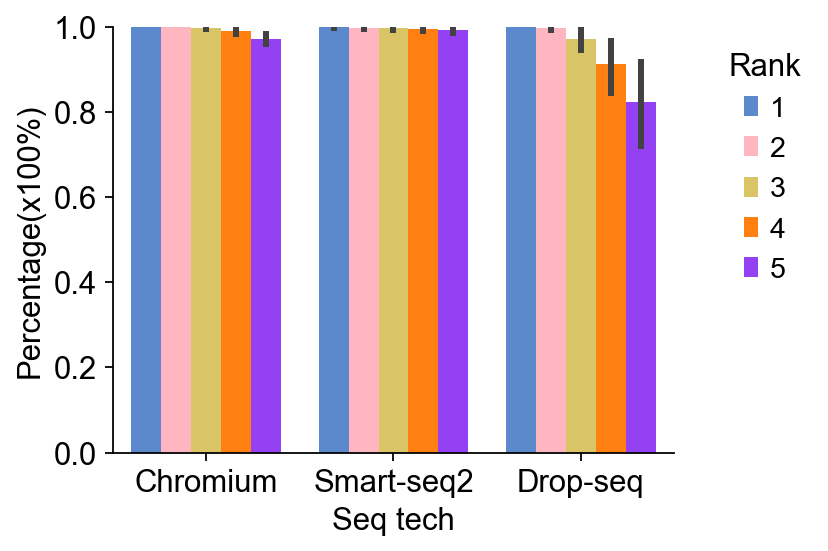

In [39]:
figsize(4.5,3.5)
sns.barplot(x='Tech', y='Sample', hue='Rank', data=df,saturation=1,palette=['#5C89CC', '#FFB6C1', '#D9C566', '#FF8011', '#9440F3'])
sns.despine()
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left',title='Rank',frameon=False)
plt.grid(visible=False)
plt.ylabel('Percentage(x100%)')#, fontsize=18)
plt.xlabel('Seq tech')#, fontsize=18)
plt.ylim(0,1.0)
plt.savefig('figures/The_top5_count_and_rank_consistency.pdf',dpi=300, bbox_inches='tight',transparent=True,format='pdf')

# END